In [1]:
# ---- CONFIGURE ME ----
MODEL = "qwen3_vl"          # qwen3_vl or gemma4
PROBE = "headwise_linear"  # headwise_linear, headwise_linear, or layerwise_rfm
# ---------------------

from pathlib import Path
import numpy as np
import pandas as pd
import json
import torch
from PIL import Image
from collections import defaultdict
import matplotlib.pyplot as plt

csv_path = Path(f"results/token_scoring/{MODEL}/lvis/prompt_token_stats_combined_ideology_{PROBE}.csv")
pt_path  = Path(f"results/token_scoring/{MODEL}/lvis/prompt_image_token_scores_combined_ideology_{PROBE}.pt")
lvis_json = Path("datasets/lvis/lvis_v1_train.json")
out_dir   = Path(f"results/token_scoring/{MODEL}/lvis")

print(f"Model: {MODEL}  |  Probe: {PROBE}")
print(f"CSV:       {csv_path}  ({csv_path.exists()})")
print(f"PT scores: {pt_path}   ({pt_path.exists()})")
print(f"LVIS JSON: {lvis_json} ({lvis_json.exists()})")

Model: qwen3_vl  |  Probe: headwise_linear
CSV:       results/token_scoring/qwen3_vl/lvis/prompt_token_stats_combined_ideology_headwise_linear.csv  (True)
PT scores: results/token_scoring/qwen3_vl/lvis/prompt_image_token_scores_combined_ideology_headwise_linear.pt   (True)
LVIS JSON: datasets/lvis/lvis_v1_train.json (True)


---
## Part 1: Per-Image Mean Score Distribution & Image Previews

In [2]:
# Load and summarize per-image stats from CSV
stats = pd.read_csv(csv_path)

mean_col = None
for candidate in ["image_mean", "all_mean", "mean"]:
    if candidate in stats.columns:
        mean_col = candidate
        break
if mean_col is None:
    raise ValueError(f"No mean column found. Columns: {list(stats.columns)}")

print(f"Using mean column: {mean_col}")

stats = stats.copy()
stats["mean"] = pd.to_numeric(stats[mean_col], errors="coerce")
stats = stats.dropna(subset=["mean"]).reset_index(drop=True)

print(f"Rows: {len(stats):,}")
print(f"\nMean score summary ({mean_col}):")
print(stats["mean"].describe(percentiles=[0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99]))

Using mean column: image_mean
Rows: 99,385

Mean score summary (image_mean):
count    99385.000000
mean         0.107475
std          0.280838
min         -0.849627
1%          -0.515203
5%          -0.337900
25%         -0.088004
50%          0.096296
75%          0.300173
95%          0.575731
99%          0.778318
max          1.210092
Name: mean, dtype: float64


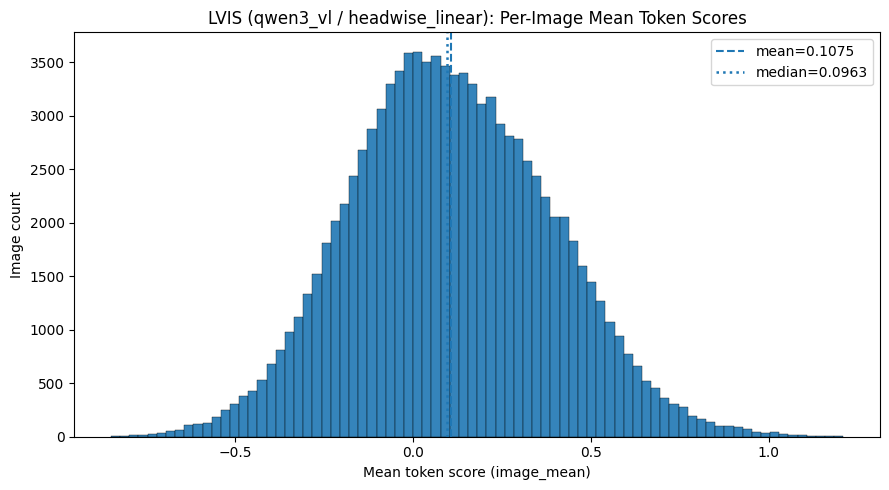

In [3]:
# Histogram
fig, ax = plt.subplots(figsize=(9, 5))
ax.hist(stats["mean"], bins=80, alpha=0.9, edgecolor="black", linewidth=0.3)
ax.axvline(stats["mean"].mean(), linestyle="--", linewidth=1.5, label=f"mean={stats['mean'].mean():.4f}")
ax.axvline(stats["mean"].median(), linestyle=":", linewidth=1.8, label=f"median={stats['mean'].median():.4f}")
ax.set_title(f"LVIS ({MODEL} / {PROBE}): Per-Image Mean Token Scores")
ax.set_xlabel(f"Mean token score ({mean_col})")
ax.set_ylabel("Image count")
ax.legend()
plt.tight_layout()
plt.show()

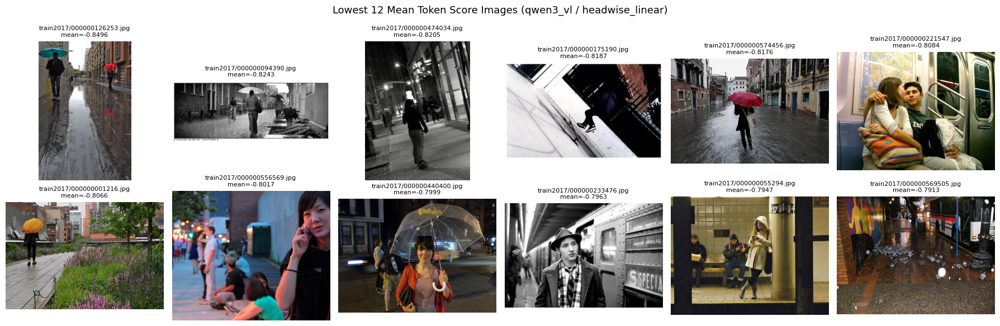

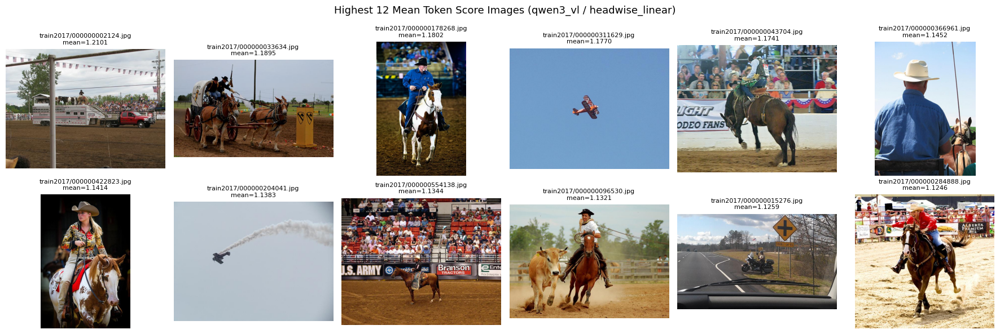

In [4]:
# Show top/bottom images
def _resolve_path(row):
    return Path(row["image_path"])

def show_extremes(df: pd.DataFrame, n: int = 12):
    low = df.nsmallest(n, "mean").copy()
    high = df.nlargest(n, "mean").copy()

    def _plot_group(group, title):
        cols = 6
        rows = int(np.ceil(len(group) / cols))
        fig, axes = plt.subplots(rows, cols, figsize=(3.0 * cols, 3.0 * rows))
        axes = np.atleast_1d(axes).flatten()
        for ax, (_, r) in zip(axes, group.iterrows()):
            img_path = _resolve_path(r)
            if not img_path.exists():
                ax.set_title(f"Missing\n{img_path.name}\nmean={r['mean']:.4f}", fontsize=8)
                ax.axis("off")
                continue
            try:
                img = Image.open(img_path).convert("RGB")
                ax.imshow(img)
                label = r.get("record_name", img_path.name)
                ax.set_title(f"{label}\nmean={r['mean']:.4f}", fontsize=8)
            except Exception as e:
                ax.set_title(f"Error\n{img_path.name}\n{type(e).__name__}", fontsize=8)
            ax.axis("off")
        for ax in axes[len(group):]:
            ax.axis("off")
        fig.suptitle(title, fontsize=13)
        plt.tight_layout()
        plt.show()

    _plot_group(low, f"Lowest {n} Mean Token Score Images ({MODEL} / {PROBE})")
    _plot_group(high, f"Highest {n} Mean Token Score Images ({MODEL} / {PROBE})")

show_extremes(stats, n=12)

---
## Part 2: Per-Class Token Score Analysis (via LVIS bboxes)

For each LVIS annotation, map the bbox to the vision-token grid and collect the token scores falling inside that region. Then aggregate by category.

In [5]:
# --- Load per-token scores from PT file ---
pt = torch.load(str(pt_path), map_location="cpu", weights_only=True)
all_scores = pt["scores"]
grid_hw    = pt["grid_hw"]
pt_records = pt["record_names"]

# Compute per-record offsets into flat scores array
tokens_per_img = grid_hw[:, 0] * grid_hw[:, 1]
offsets_pt = torch.cat([torch.zeros(1, dtype=torch.long), tokens_per_img.cumsum(0)])

# record_name -> flat index
record_to_idx = {pt_records[i]: i for i in range(len(pt_records))}

# Build record_name -> {grid_h, grid_w, image_h, image_w} from CSV
img_meta = {}
for _, row in stats.iterrows():
    img_meta[row["record_name"]] = {
        "grid_h": int(row["grid_h"]),
        "grid_w": int(row["grid_w"]),
        "image_h": int(row["image_h"]),
        "image_w": int(row["image_w"]),
    }

# image_id -> list of record_names (extract numeric id from record_name)
def record_name_to_image_id(rn: str) -> int:
    return int(Path(rn).stem)

image_id_to_records = defaultdict(list)
for record_name in stats["record_name"]:
    img_id = record_name_to_image_id(record_name)
    image_id_to_records[img_id].append(record_name)

print(f"Total records: {len(pt_records):,}")
print(f"Total image tokens: {len(all_scores):,}")
print(f"Unique LVIS image IDs in CSV: {len(image_id_to_records):,}")

Total records: 99,385
Total image tokens: 26,633,067
Unique LVIS image IDs in CSV: 99,385


In [6]:
# --- Load LVIS annotations ---
with open(lvis_json) as f:
    lvis = json.load(f)

cat_id_to_name = {cat["id"]: cat["name"] for cat in lvis["categories"]}
cat_id_to_freq = {cat["id"]: cat["frequency"] for cat in lvis["categories"]}
print(f"LVIS categories: {len(cat_id_to_name)}")

# image_id -> [ {bbox, category_id, area} ]
lvis_img_to_anns = defaultdict(list)
for ann in lvis["annotations"]:
    lvis_img_to_anns[ann["image_id"]].append({
        "bbox": ann["bbox"],
        "category_id": ann["category_id"],
        "area": ann["area"],
    })

print(f"LVIS images with annotations: {len(lvis_img_to_anns):,}")
print(f"Total LVIS annotations: {sum(len(v) for v in lvis_img_to_anns.values()):,}")

LVIS categories: 1203
LVIS images with annotations: 99,388
Total LVIS annotations: 1,270,141


In [7]:
# --- Map bboxes to token grid and collect per-category scores ---
# For each image, average all instances of the same category into one score.

category_token_scores = defaultdict(list)    # cat_id -> list of per-image mean scores (one per image per category)
category_token_counts = defaultdict(list)    # cat_id -> list of total token counts per image per category

n_matched = 0
n_unmatched = 0

for lvis_img_id, anns in lvis_img_to_anns.items():
    if lvis_img_id not in image_id_to_records:
        n_unmatched += 1
        continue
    record_name = image_id_to_records[lvis_img_id][0]
    if record_name not in record_to_idx or record_name not in img_meta:
        n_unmatched += 1
        continue

    meta = img_meta[record_name]
    grid_h, grid_w = meta["grid_h"], meta["grid_w"]
    img_w, img_h = meta["image_w"], meta["image_h"]
    if grid_h * grid_w == 0:
        continue

    idx = record_to_idx[record_name]
    start, end = int(offsets_pt[idx]), int(offsets_pt[idx + 1])
    if end - start != grid_h * grid_w:
        continue

    token_grid = all_scores[start:end].view(grid_h, grid_w).float()

    # Collect all patches per category within this image
    img_cat_patches = defaultdict(list)  # cat_id -> list of patch tensors
    for ann in anns:
        x, y, w, h = ann["bbox"]
        cat_id = ann["category_id"]

        tx0 = int(x / img_w * grid_w)
        ty0 = int(y / img_h * grid_h)
        tx1 = int((x + w) / img_w * grid_w)
        ty1 = int((y + h) / img_h * grid_h)

        tx0 = max(0, min(tx0, grid_w - 1))
        tx1 = max(tx0 + 1, min(tx1, grid_w))
        ty0 = max(0, min(ty0, grid_h - 1))
        ty1 = max(ty0 + 1, min(ty1, grid_h))

        patch = token_grid[ty0:ty1, tx0:tx1]
        if patch.numel() > 0:
            img_cat_patches[cat_id].append(patch)

    # Average all instances of the same category within this image into one score
    for cat_id, patches in img_cat_patches.items():
        all_vals = torch.cat([p.flatten() for p in patches])
        category_token_scores[cat_id].append(all_vals.mean().item())
        category_token_counts[cat_id].append(all_vals.numel())

    n_matched += 1
    if n_matched % 10000 == 0:
        print(f"  Processed {n_matched:,} images...")

print(f"\nImages processed:     {n_matched:,}")
print(f"Images unmatched:     {n_unmatched:,}")
print(f"Categories with scores: {len(category_token_scores)}")
print(f"Per-annotation observations: {sum(len(v) for v in category_token_scores.values()):,}")

  Processed 10,000 images...
  Processed 20,000 images...
  Processed 30,000 images...
  Processed 40,000 images...
  Processed 50,000 images...
  Processed 60,000 images...
  Processed 70,000 images...
  Processed 80,000 images...
  Processed 90,000 images...

Images processed:     99,385
Images unmatched:     3
Categories with scores: 1203
Per-annotation observations: 360,935


In [8]:
# --- Build per-category summary DataFrame ---

cat_summary = []
for cat_id, scores in category_token_scores.items():
    counts = category_token_counts[cat_id]
    s = np.array(scores)
    cat_summary.append({
        "category_id": cat_id,
        "category_name": cat_id_to_name[cat_id],
        "frequency": cat_id_to_freq.get(cat_id, "?"),
        "n_annotations": len(scores),
        "mean_score": s.mean(),
        "median_score": np.median(s),
        "std_score": s.std(),
        "q01": np.quantile(s, 0.01),
        "q05": np.quantile(s, 0.05),
        "q25": np.quantile(s, 0.25),
        "q75": np.quantile(s, 0.75),
        "q95": np.quantile(s, 0.95),
        "q99": np.quantile(s, 0.99),
        "mean_tokens_per_bbox": np.array(counts).mean(),
    })

cat_df = pd.DataFrame(cat_summary).sort_values("mean_score")
print(f"\nPer-category score summary (all {len(cat_df)} categories):")

# Filter for categories that appeared in at least 50 images
cat_df = cat_df[cat_df["n_annotations"] >= 50].copy()
print(f"After filtering (>=50 images): {len(cat_df)} categories")
cat_df = cat_df.sort_values("mean_score").reset_index(drop=True)
cat_df.set_index("category_id")


Per-category score summary (all 1203 categories):
After filtering (>=50 images): 537 categories


,category_name,frequency,n_annotations,mean_score,median_score,std_score,q01,q05,q25,q75,q95,q99,mean_tokens_per_bbox
category_id,,,,,,,,,,,,,
609,kitchen_sink,f,489,-0.514303,-0.509616,0.284005,-1.118327,-0.955073,-0.709755,-0.323437,-0.031845,0.144647,13.161554
636,legging_(clothing),c,76,-0.476495,-0.460461,0.271235,-1.041669,-0.932640,-0.680299,-0.289164,-0.102324,0.092704,11.723684
773,pea_(food),c,76,-0.433888,-0.431006,0.322386,-1.125519,-0.972983,-0.579217,-0.283417,-0.031208,0.406421,30.513158
514,green_bean,f,124,-0.409288,-0.428931,0.246683,-0.953742,-0.749795,-0.568550,-0.266987,0.057240,0.295896,52.435484
949,shopping_bag,f,139,-0.398717,-0.382694,0.304552,-1.046810,-0.871451,-0.615638,-0.151101,0.080300,0.212127,9.438849
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017,stirrup,f,305,0.751913,0.743119,0.328009,-0.035212,0.270993,0.538310,0.977855,1.348783,1.551870,2.993443
319,cowboy_hat,f,216,0.757106,0.774482,0.439130,-0.451945,-0.007638,0.486565,1.045149,1.432303,1.923378,6.819444
552,headstall_(for_horses),c,74,0.771198,0.776214,0.246263,0.237035,0.430277,0.605484,0.921526,1.171564,1.338480,8.040541


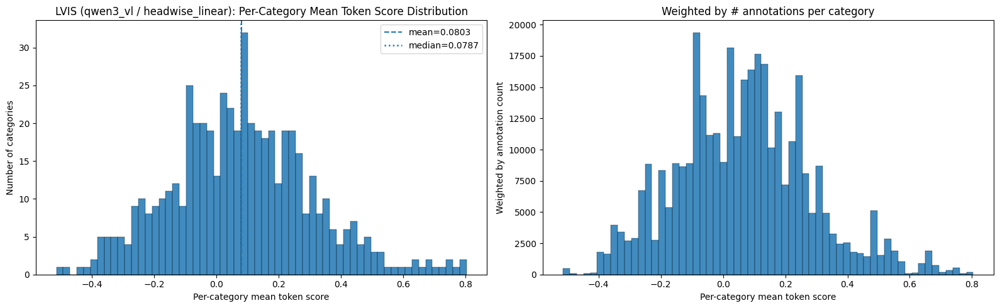

In [9]:
# --- Per-category mean score distribution ---
scores_all = cat_df["mean_score"].values
annot_counts = cat_df["n_annotations"].values

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

ax = axes[0]
ax.hist(scores_all, bins=60, edgecolor="black", linewidth=0.3, alpha=0.85)
ax.axvline(np.mean(scores_all), ls="--", lw=1.5, label=f"mean={np.mean(scores_all):.4f}")
ax.axvline(np.median(scores_all), ls=":", lw=1.8, label=f"median={np.median(scores_all):.4f}")
ax.set_xlabel("Per-category mean token score")
ax.set_ylabel("Number of categories")
ax.set_title(f"LVIS ({MODEL} / {PROBE}): Per-Category Mean Token Score Distribution")
ax.legend()

ax = axes[1]
ax.hist(scores_all, bins=60, weights=annot_counts, edgecolor="black", linewidth=0.3, alpha=0.85)
ax.set_xlabel("Per-category mean token score")
ax.set_ylabel("Weighted by annotation count")
ax.set_title("Weighted by # annotations per category")

plt.tight_layout()
plt.show()

/scratch/local/jobs/50073581/ipykernel_2923788/3114329662.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name)(np.linspace(0.3, 0.9, len(means)))
/scratch/local/jobs/50073581/ipykernel_2923788/3114329662.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name)(np.linspace(0.3, 0.9, len(means)))


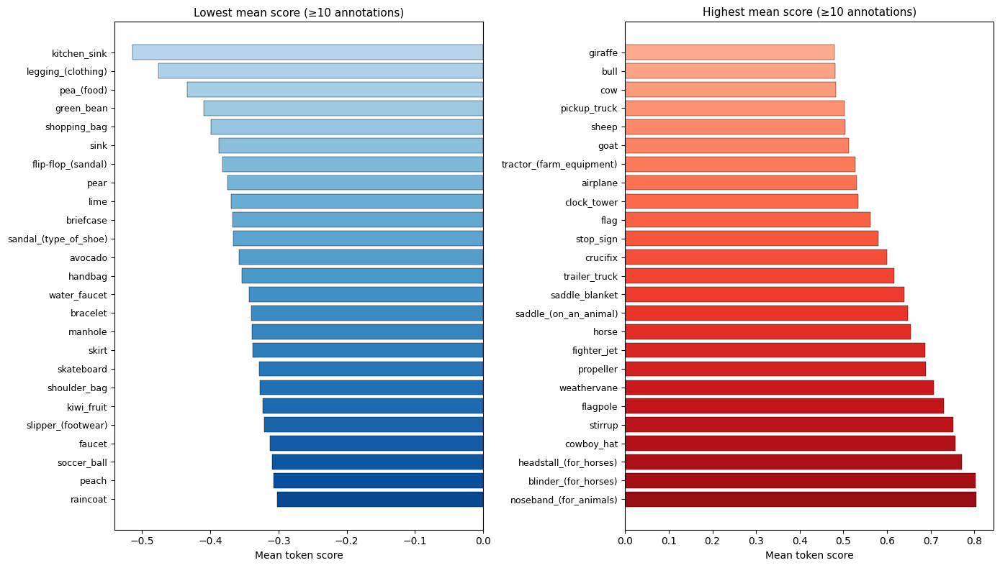

In [10]:
# --- Top/bottom categories bar chart ---

def plot_top_bottom_cats(df: pd.DataFrame, n: int = 25, min_annotations: int = 10):
    filt = df[df["n_annotations"] >= min_annotations]
    bottom = filt.head(n)
    top = filt.tail(n)

    fig, axes = plt.subplots(1, 2, figsize=(14, max(8, n * 0.3)))
    for ax, subset, title, cmap_name in [
        (axes[0], bottom, f"Lowest mean score (\u2265{min_annotations} annotations)", "Blues"),
        (axes[1], top, f"Highest mean score (\u2265{min_annotations} annotations)", "Reds"),
    ]:
        names = subset["category_name"].values
        means = subset["mean_score"].values
        colors = plt.cm.get_cmap(cmap_name)(np.linspace(0.3, 0.9, len(means)))
        ax.barh(range(len(names)), means, color=colors, edgecolor="black", linewidth=0.3)
        ax.set_yticks(range(len(names)))
        ax.set_yticklabels(names, fontsize=9)
        ax.set_xlabel("Mean token score")
        ax.set_title(title, fontsize=11)
        ax.axvline(0, color="gray", linewidth=0.8)
        ax.invert_yaxis()
    plt.tight_layout()
    plt.show()

plot_top_bottom_cats(cat_df, n=25, min_annotations=10)

/scratch/local/jobs/50073581/ipykernel_2923788/3114329662.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name)(np.linspace(0.3, 0.9, len(means)))
/scratch/local/jobs/50073581/ipykernel_2923788/3114329662.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name)(np.linspace(0.3, 0.9, len(means)))


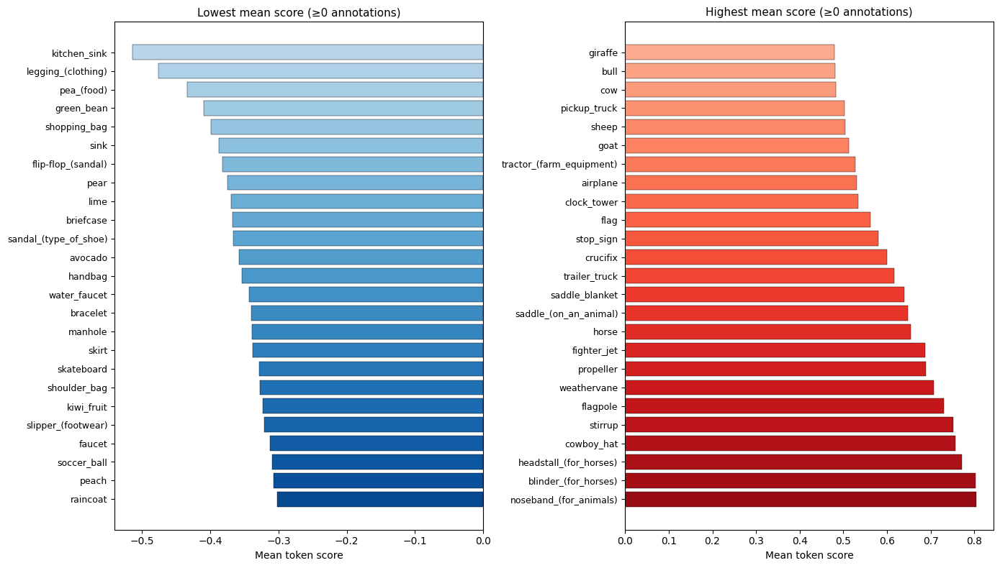

In [11]:
# --- Top/bottom including rare categories ---
plot_top_bottom_cats(cat_df, n=25, min_annotations=0)

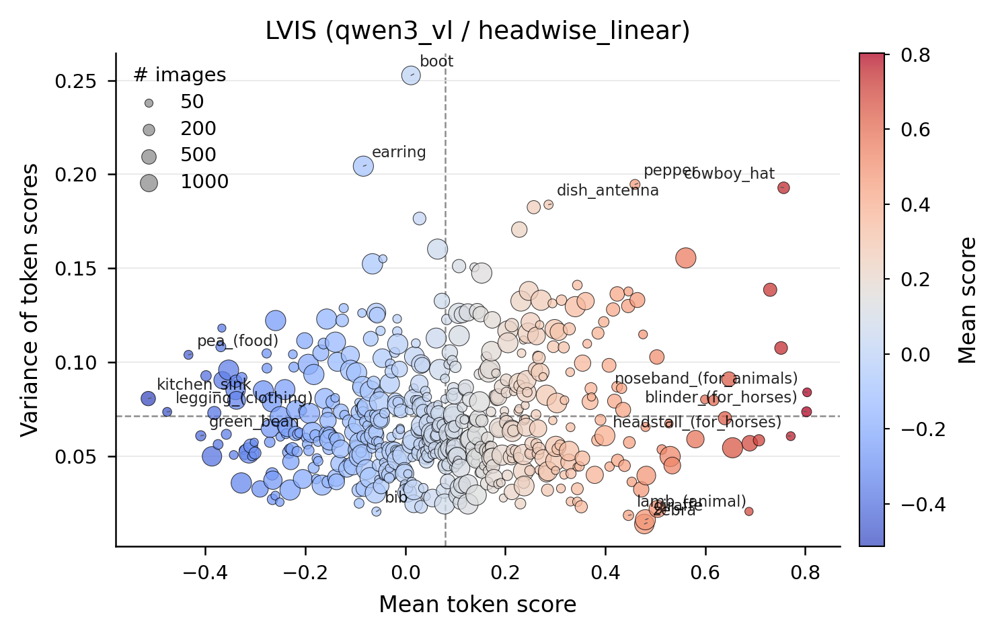

In [12]:
# --- Nature-style scatter plot: mean score vs variance, point size = n_annotations ---
import math
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd

# -----------------------------
# Nature-ish global styling
# -----------------------------
mpl.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "Helvetica", "DejaVu Sans"],
    "font.size": 8,
    "axes.titlesize": 9,
    "axes.labelsize": 8,
    "xtick.labelsize": 7,
    "ytick.labelsize": 7,
    "legend.fontsize": 7,
    "legend.title_fontsize": 7,
    "axes.linewidth": 0.6,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "xtick.major.size": 3,
    "ytick.major.size": 3,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})

# Prepare values
cat_df = cat_df.copy()
cat_df["variance"] = cat_df["std_score"] ** 2
cat_df["point_size"] = cat_df["n_annotations"].map(lambda x: math.sqrt(x) * 1.2)

mean_of_means = cat_df["mean_score"].mean()
mean_of_vars = cat_df["variance"].mean()

# Single-column-ish Nature figure size
fig, ax = plt.subplots(figsize=(5, 3.2), dpi=300)

sc = ax.scatter(
    cat_df["mean_score"],
    cat_df["variance"],
    s=cat_df["point_size"],
    c=cat_df["mean_score"],
    cmap="coolwarm",
    alpha=0.75,
    edgecolor="black",
    linewidth=0.25,
    rasterized=True,
)

# Reference lines
ax.axhline(mean_of_vars, color="0.55", linestyle="--", linewidth=0.6, zorder=0)
ax.axvline(mean_of_means, color="0.55", linestyle="--", linewidth=0.6, zorder=0)

# Labels and title
ax.set_xlabel("Mean token score")
ax.set_ylabel("Variance of token scores")
ax.set_title(f"LVIS ({MODEL} / {PROBE})", pad=5)

# Minimal axes
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# Light horizontal grid only
ax.yaxis.grid(True, color="0.9", linewidth=0.4)
ax.xaxis.grid(False)
ax.set_axisbelow(True)

# Colorbar: narrow and understated
cbar = fig.colorbar(sc, ax=ax, fraction=0.045, pad=0.025)
cbar.set_label("Mean score", labelpad=4)
cbar.outline.set_linewidth(0.5)
cbar.ax.tick_params(width=0.5, length=2, labelsize=7)

# Point-size legend
legend_ns = [50, 200, 500, 1000]
for n in legend_ns:
    ax.scatter(
        [], [],
        s=math.sqrt(n) * 1.2,
        c="0.55",
        alpha=0.75,
        edgecolor="black",
        linewidth=0.25,
        label=f"{n}",
    )

leg = ax.legend(
    title="# images",
    scatterpoints=1,
    loc="upper left",
    frameon=False,
    handletextpad=0.6,
    borderpad=0.2,
    labelspacing=0.4,
)

# Annotate representative categories
top_var = cat_df.nlargest(5, "variance")
top_mean = cat_df.nlargest(4, "mean_score")
bot_mean = cat_df.nsmallest(4, "mean_score")
bot_var = cat_df.nsmallest(4, "variance")

label_cats = (
    pd.concat([top_var, top_mean, bot_mean, bot_var])
    .drop_duplicates(subset="category_name")
)

top_mean_names = set(top_mean["category_name"])

for _, row in label_cats.iterrows():
    is_top_mean = row["category_name"] in top_mean_names

    ax.annotate(
        row["category_name"],
        (row["mean_score"], row["variance"]),
        textcoords="offset points",
        xytext=(-3, 2) if is_top_mean else (3, 2),
        ha="right" if is_top_mean else "left",
        va="bottom",
        fontsize=5.5,
        alpha=0.85,
        arrowprops=dict(
            arrowstyle="-",
            color="0.35",
            lw=0.35,
            shrinkA=0,
            shrinkB=2,
        ),
    )

plt.tight_layout()
plt.show()

---
## Part 3: Heatmap Overlays for Top/Lowest Categories

For each of the 20 highest- and 20 lowest-mean-score categories, pick a representative annotation and overlay the token-score heatmap on the image. Red = higher score, blue = lower score.

In [13]:
# ---- Heatmap helper functions ----

def overlay_heatmap(img_pil, heatmap_2d, vmin, vmax, alpha=0.5, cmap="jet"):
    """Overlay a (grid_h, grid_w) heatmap onto a PIL image."""
    img = np.asarray(img_pil).astype(np.float32) / 255.0
    H, W = img.shape[:2]

    hm = heatmap_2d.astype(np.float32)
    denom = (vmax - vmin) if (vmax - vmin) > 1e-8 else 1.0
    hm01 = (hm - vmin) / denom
    hm01 = np.clip(hm01, 0.0, 1.0)

    hm_up = np.array(Image.fromarray((hm01 * 255).astype(np.uint8)).resize((W, H), resample=Image.NEAREST)) / 255.0
    hm_rgb = plt.cm.get_cmap(cmap)(hm_up)[..., :3]
    out = (1 - alpha) * img + alpha * hm_rgb
    return np.clip(out, 0.0, 1.0)


# ---- Precompute category -> list of (record_name, score, bbox) ----
# This runs once and builds a lookup for fast heatmap generation.

category_annotations = defaultdict(list)  # cat_id -> [(record_name, score, bbox), ...]

cat_offset = 0
for lvis_img_id, anns in lvis_img_to_anns.items():
    if lvis_img_id not in image_id_to_records:
        continue
    record_name = image_id_to_records[lvis_img_id][0]
    if record_name not in record_to_idx or record_name not in img_meta:
        continue
    meta = img_meta[record_name]
    grid_h, grid_w = meta["grid_h"], meta["grid_w"]
    img_w, img_h = meta["image_w"], meta["image_h"]
    if grid_h * grid_w == 0:
        continue
    idx = record_to_idx[record_name]
    start, end = int(offsets_pt[idx]), int(offsets_pt[idx + 1])
    if end - start != grid_h * grid_w:
        continue
    token_grid = all_scores[start:end].view(grid_h, grid_w).float()

    for ann in anns:
        cat_id = ann["category_id"]
        x, y, w, h = ann["bbox"]
        tx0 = int(x / img_w * grid_w)
        ty0 = int(y / img_h * grid_h)
        tx1 = int((x + w) / img_w * grid_w)
        ty1 = int((y + h) / img_h * grid_h)
        tx0 = max(0, min(tx0, grid_w - 1))
        tx1 = max(tx0 + 1, min(tx1, grid_w))
        ty0 = max(0, min(ty0, grid_h - 1))
        ty1 = max(ty0 + 1, min(ty1, grid_h))
        patch = token_grid[ty0:ty1, tx0:tx1]
        if patch.numel() > 0:
            category_annotations[cat_id].append((record_name, patch.mean().item(), ann["bbox"]))

    cat_offset += 1
    if cat_offset % 10000 == 0:
        print(f"  Indexed {cat_offset:,} images...")

print(f"\nIndexed {cat_offset:,} images into category lookup")
print(f"Categories with entries: {len(category_annotations)}")


def get_token_grid_for_record(record_name):
    """Get the (grid_h, grid_w) 2D token scores for a record."""
    if record_name not in record_to_idx or record_name not in img_meta:
        return None
    meta = img_meta[record_name]
    grid_h, grid_w = meta["grid_h"], meta["grid_w"]
    if grid_h * grid_w == 0:
        return None
    idx = record_to_idx[record_name]
    start, end = int(offsets_pt[idx]), int(offsets_pt[idx + 1])
    if end - start != grid_h * grid_w:
        return None
    return all_scores[start:end].view(grid_h, grid_w).float().numpy()


def pick_and_load_representative(cat_id, cat_df):
    """Pick the annotation closest to the category mean, load image + token grid."""
    entries = category_annotations.get(cat_id, [])
    if not entries:
        return None, None, None
    target_mean = cat_df[cat_df["category_id"] == cat_id]["mean_score"].values[0]
    scores = np.array([e[1] for e in entries])
    best_i = np.argmin(np.abs(scores - target_mean))
    record_name, ann_score, bbox = entries[best_i]
    img_row = stats[stats["record_name"] == record_name]
    if len(img_row) == 0:
        return None, None, None
    img_path = Path(img_row.iloc[0]["image_path"])
    return img_path, record_name, ann_score, bbox


  Indexed 10,000 images...
  Indexed 20,000 images...
  Indexed 30,000 images...
  Indexed 40,000 images...
  Indexed 50,000 images...
  Indexed 60,000 images...
  Indexed 70,000 images...
  Indexed 80,000 images...
  Indexed 90,000 images...

Indexed 99,385 images into category lookup
Categories with entries: 1203


Heatmap color range: [-1.000, 1.000]

=== Lowest 20 categories ===


/scratch/local/jobs/50073581/ipykernel_2923788/2264459904.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  hm_rgb = plt.cm.get_cmap(cmap)(hm_up)[..., :3]


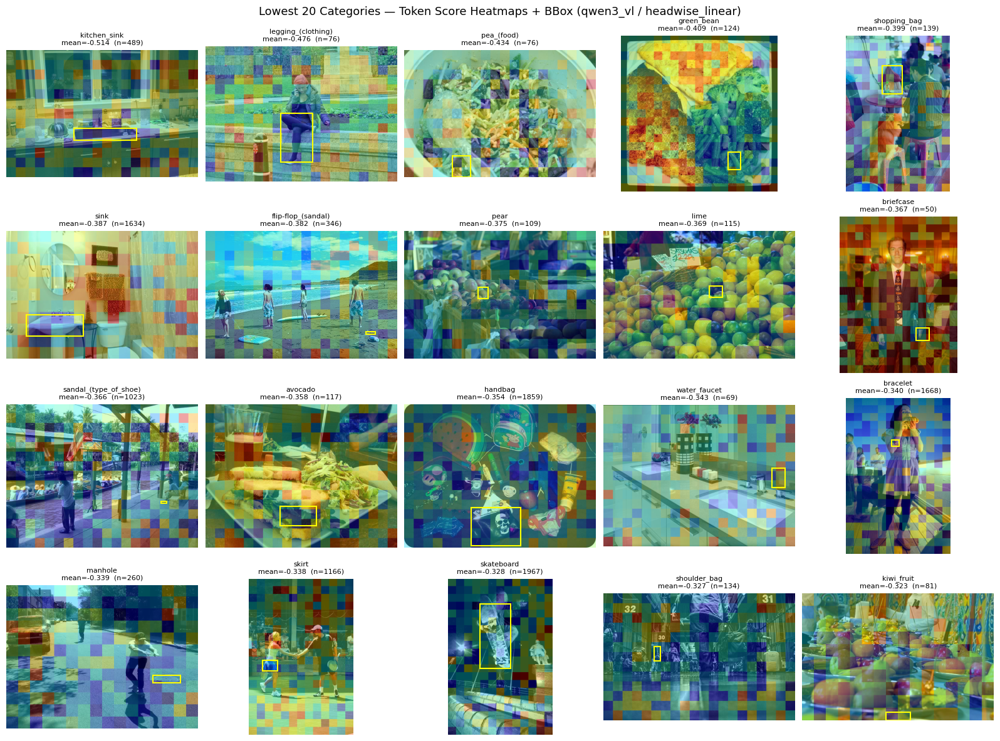


=== Highest 20 categories ===


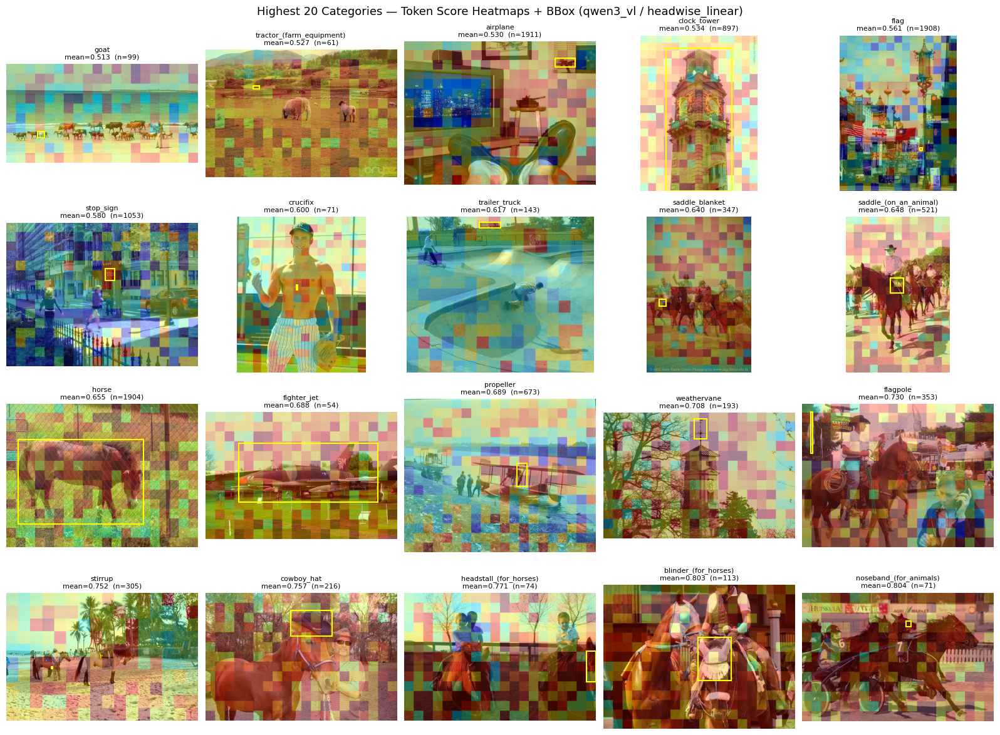

In [14]:
# ---- Generate heatmaps for top-20 lowest and highest categories ----

from matplotlib.patches import Rectangle

N_CATS = 20
MIN_ANNOTATIONS = 50

filt = cat_df[cat_df["n_annotations"] >= MIN_ANNOTATIONS]
lowest_cats  = filt.head(N_CATS)["category_id"].values
highest_cats = filt.tail(N_CATS)["category_id"].values

# Global vmin/vmax from all per-token scores
VMAX = 1.0
VMIN = -1.0
print(f"Heatmap color range: [{VMIN:.3f}, {VMAX:.3f}]")


def plot_category_heatmaps(cat_ids, group_label):
    cols = 5
    rows = int(np.ceil(len(cat_ids) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(3.2 * cols, 3.0 * rows))
    axes = np.atleast_1d(axes).flatten()

    for ax, cat_id in zip(axes, cat_ids):
        cat_name = cat_id_to_name[cat_id]
        cat_mean = cat_df[cat_df["category_id"] == cat_id]["mean_score"].values[0]
        n_ann = cat_df[cat_df["category_id"] == cat_id]["n_annotations"].values[0]

        img_path, record_name, ann_score, bbox = pick_and_load_representative(cat_id, cat_df)

        if img_path is None or record_name is None:
            ax.set_title(f"{cat_name}\n(no image found)", fontsize=8)
            ax.axis("off")
            continue

        if not img_path.exists():
            ax.set_title(f"{cat_name}\n(missing file)", fontsize=8)
            ax.axis("off")
            continue

        token_grid = get_token_grid_for_record(record_name)
        if token_grid is None:
            ax.set_title(f"{cat_name}\n(no token grid)", fontsize=8)
            ax.axis("off")
            continue

        try:
            img = Image.open(img_path).convert("RGB")
            over = overlay_heatmap(img, token_grid, VMIN, VMAX, alpha=0.35, cmap="jet")
            ax.imshow(over)
            # Draw bbox outline
            x, y, w, h = bbox
            rect = Rectangle((x, y), w, h, linewidth=1.5, edgecolor="yellow", facecolor="none", linestyle="-")
            ax.add_patch(rect)
            ax.set_title(f"{cat_name}\nmean={cat_mean:.3f}  (n={n_ann})", fontsize=8)
        except Exception as e:
            ax.set_title(f"{cat_name}\nerror: {type(e).__name__}", fontsize=8)
        ax.axis("off")

    for ax in axes[len(cat_ids):]:
        ax.axis("off")

    fig.suptitle(f"{group_label} {N_CATS} Categories — Token Score Heatmaps + BBox ({MODEL} / {PROBE})", fontsize=13)
    plt.tight_layout()
    plt.show()


print(f"\n=== Lowest {N_CATS} categories ===")
plot_category_heatmaps(lowest_cats, "Lowest")

print(f"\n=== Highest {N_CATS} categories ===")
plot_category_heatmaps(highest_cats, "Highest")


In [17]:
filt

,category_id,category_name,frequency,n_annotations,mean_score,median_score,std_score,q01,q05,q25,q75,q95,q99,mean_tokens_per_bbox,variance,point_size
0,609,kitchen_sink,f,489,-0.514303,-0.509616,0.284005,-1.118327,-0.955073,-0.709755,-0.323437,-0.031845,0.144647,13.161554,0.080659,26.536013
1,636,legging_(clothing),c,76,-0.476495,-0.460461,0.271235,-1.041669,-0.932640,-0.680299,-0.289164,-0.102324,0.092704,11.723684,0.073569,10.461357
2,773,pea_(food),c,76,-0.433888,-0.431006,0.322386,-1.125519,-0.972983,-0.579217,-0.283417,-0.031208,0.406421,30.513158,0.103933,10.461357
3,514,green_bean,f,124,-0.409288,-0.428931,0.246683,-0.953742,-0.749795,-0.568550,-0.266987,0.057240,0.295896,52.435484,0.060853,13.362634
4,949,shopping_bag,f,139,-0.398717,-0.382694,0.304552,-1.046810,-0.871451,-0.615638,-0.151101,0.080300,0.212127,9.438849,0.092752,14.147791
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
532,1017,stirrup,f,305,0.751913,0.743119,0.328009,-0.035212,0.270993,0.538310,0.977855,1.348783,1.551870,2.993443,0.107590,20.957099
533,319,cowboy_hat,f,216,0.757106,0.774482,0.439130,-0.451945,-0.007638,0.486565,1.045149,1.432303,1.923378,6.819444,0.192835,17.636326
534,552,headstall_(for_horses),c,74,0.771198,0.776214,0.246263,0.237035,0.430277,0.605484,0.921526,1.171564,1.338480,8.040541,0.060646,10.322790
535,1191,blinder_(for_horses),f,113,0.802910,0.783808,0.271380,0.256291,0.419112,0.598954,0.992166,1.236884,1.479023,4.415929,0.073647,12.756175
